In [1]:
import scrublet as scr
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy


def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures_organoids/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.8.0
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                 9.4.0
anndata             0.8.0
asciitree           NA
backcall            0.2.0
cairo               1.20.0
cffi                1.14.4
cloudpickle         2.0.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2022.02.1
dateutil            2.8.2
decorator           4.4.2
defusedxml          0.7.1
fasteners           0.17.3
fsspec              2022.02.0
google              NA
h5py                3.8.0
igraph              0.10.8
ipykernel           5.4.3
ipython_genutils    0.2.0
jedi                0.18.0
jinja2              3.1.2
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.10.1
llvmlite            0.35.0
louvain             0.7.1
markupsafe          2.1.2
matplotlib          3.6.3
mpl_toolkits        NA
msgpack             1.0.3
natsort             8.2.0
numba               0.52.0
numcodecs           0.9.1
numexpr            

'/opt/conda/envs/atac_env/bin/python'

### 1. Create metadata table

In [2]:
metadata = {'sample' : ['HD_F_GON15290540', 'HD_F_GON15290541', 'HD_F_GON15290542', 'HD_F_GON15290543', 'HD_F_GON15290544', 
                       'HD_F_GON15290545', 'HD_F_GON15290546', 'HD_F_GON15290547', 'HD_F_GON15290548', 'HD_F_GON15290549', 
                       'HD_F_GON15290550', 'HD_F_GON15290551', 'HD_F_GON15290552', 'HD_F_GON15290553', 'HD_F_GON15290554', 
                       'HD_F_GON15290555', 'HD_F_GON15290556', 'HD_F_GON15290557', 'HD_F_GON15290558', 'HD_F_GON15290559', 
                       'HD_F_GON14896471', 'HD_F_GON14896472'], 
           'donor' : ['Hrv276', 'Hrv276', 'Hrv276', 'Hrv276', 'Hrv276', 
                     'Hrv277', 'Hrv277', 'Hrv277', 'Hrv277', 'Hrv277', 
                     'Hrv276', 'Hrv276', 'Hrv276', 'Hrv276', 
                     'Hrv277', 'Hrv277', 'Hrv277', 'Hrv277', 'Hrv277', 
                     'Hrv276', 
                     'Hrv152', 'Hrv152'],
            'sex' : ['female', 'female', 'female', 'female', 'female', 
                    'female', 'female', 'female', 'female', 'female', 
                     'female', 'female', 'female', 'female', 
                    'female', 'female', 'female', 'female', 'female',
                    'female', 'female', 'female'],
            'stage_pcw' : [12, 12, 12, 12, 12, 17, 17, 17, 17, 17,
                           12, 12, 12, 12, 17, 17, 17, 17, 17, 12, 
                           18, 18
                          ],
           'condition' : ['ctrl_pbs', 'DOX', 'ctrl_dmso', 'BPA', 'BPP', 
                          'ctrl_pbs', 'DOX', 'ctrl_dmso', 'BPA', 'BPP', 
                          'ctrl_pbs', 'DOX', 'ctrl_dmso', 'BPP', 
                          'ctrl_pbs', 'DOX', 'ctrl_dmso', 'BPA', 'BPP', 
                          'BPA', 'ctrl_pbs', 'DOX'], 
           'timepoint' : ['D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 'D4', 
                         'D6', 'D6', 'D6', 'D6', 
                         'D6', 'D6', 'D6', 'D6', 'D6', 
                         'D6', 
                          'D4', 'D4']
                      }
metadata = pd.DataFrame(metadata)
metadata = metadata.set_index('sample')
metadata

,donor,sex,stage_pcw,condition,timepoint
sample,,,,,
HD_F_GON15290540,Hrv276,female,12,ctrl_pbs,D4
HD_F_GON15290541,Hrv276,female,12,DOX,D4
HD_F_GON15290542,Hrv276,female,12,ctrl_dmso,D4
HD_F_GON15290543,Hrv276,female,12,BPA,D4
HD_F_GON15290544,Hrv276,female,12,BPP,D4
HD_F_GON15290545,Hrv277,female,17,ctrl_pbs,D4
HD_F_GON15290546,Hrv277,female,17,DOX,D4
HD_F_GON15290547,Hrv277,female,17,ctrl_dmso,D4
HD_F_GON15290548,Hrv277,female,17,BPA,D4


### 2. Read in organoid data

In [17]:
data_dir = '/nfs/team292/vl6/FetalReproductiveTract/RNA_QC_CellBender/data/'
figures_dir = '/nfs/team292/vl6/FetalReproductiveTract/RNA_QC_CellBender/figures/'

In [3]:
import anndata

In [5]:
holder = []
for sample in metadata.index:
    adata = sc.read_h5ad(data_dir + sample + '.h5ad')
    print(adata.raw.X[20:30, 20:30].toarray())
    adata = anndata.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs)
    adata.obs['sample'] = sample
    adata.obs['donor'] = adata.obs['sample'].map(metadata['donor'].to_dict())
    adata.obs['stage_pcw'] = adata.obs['sample'].map(metadata['stage_pcw'].to_dict())
    adata.obs['sex'] = adata.obs['sample'].map(metadata['sex'].to_dict())
    adata.obs['condition'] = adata.obs['sample'].map(metadata['condition'].to_dict())
    adata.obs['timepoint'] = adata.obs['sample'].map(metadata['timepoint'].to_dict())
    adata = adata[[i != 1 for i in adata.obs['predicted_doublets']]]
    adata = adata[[i < 0.4 for i in adata.obs['doublet_scores']]]
    holder.append(adata)

[[ 1.  5.  0.  0.  0.  0.  5.  1.  0.  2.]
 [ 3. 15.  0.  0.  0.  2.  1.  0.  0.  6.]
 [ 4. 10.  0.  0.  0.  0.  3.  0.  0.  1.]
 [ 1. 12.  0.  0.  0.  3.  3.  0.  0.  2.]
 [ 0. 12.  2.  0.  0.  2.  1.  0.  0.  2.]
 [ 1. 15.  0.  0.  0.  3.  1.  0.  0.  4.]
 [ 3.  1.  0.  0.  0.  0.  3.  0.  0.  3.]
 [ 1.  8.  1.  0.  0.  0. 13.  0.  0.  2.]
 [ 3. 11.  0.  0.  0.  2.  2.  1.  0.  6.]
 [ 2. 12.  0.  0.  0.  1.  3.  2.  0.  7.]]
[[24.  2.  0.  0.  1. 10.  2.  0.  2.  1.]
 [12.  0.  0.  0.  3.  2.  1.  0.  2.  1.]
 [11.  0.  0.  0.  1.  4.  1.  0.  2.  0.]
 [20.  0.  0.  0.  1.  8.  0.  0.  3.  0.]
 [13.  0.  0.  0.  2.  0.  1.  2.  5.  0.]
 [17.  0.  0.  0.  2.  1.  0.  0.  3.  0.]
 [40.  1.  0.  0.  0.  2.  0.  0.  3.  0.]
 [17.  0.  0.  0.  0.  3.  0.  0.  2.  1.]
 [12.  0.  0.  0.  2.  6.  1.  0.  5.  2.]
 [ 6.  0.  0.  0.  1.  3.  0.  0.  2.  1.]]
[[13.  1.  0.  0.  0.  3.  0.  0.  2.  1.]
 [19.  0.  0.  0.  0.  1.  0.  0.  1.  0.]
 [10.  0.  0.  0.  0.  4.  0.  0.  3.  0.]
 [24.  0.

In [6]:
# confirm N samples
print(len(holder))
# merge datasets
adata = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata.X = adata.X.tocsr()
adata

22


/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) co

AnnData object with n_obs × n_vars = 123598 × 26381
    obs: 'n_counts', 'n_genes', 'sample', 'percent_mito', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'donor', 'stage_pcw', 'sex', 'condition', 'timepoint', 'batch'
    var: 'GeneID-0', 'GeneName-0', 'n_cells-0', 'GeneID-1', 'GeneName-1', 'n_cells-1', 'GeneID-10', 'GeneName-10', 'n_cells-10', 'GeneID-11', 'GeneName-11', 'n_cells-11', 'GeneID-12', 'GeneName-12', 'n_cells-12', 'GeneID-13', 'GeneName-13', 'n_cells-13', 'GeneID-14', 'GeneName-14', 'n_cells-14', 'GeneID-15', 'GeneName-15', 'n_cells-15', 'GeneID-16', 'GeneName-16', 'n_cells-16', 'GeneID-17', 'GeneName-17', 'n_cells-17', 'GeneID-18', 'GeneName-18', 'n_cells-18', 'GeneID-19', 'GeneName-19', 'n_cells-19', 'GeneID-2', 'GeneName-2', 'n_cells-2', 'GeneID-20', 'GeneName-20', 'n_cells-20', 'GeneID-21', 'GeneName-21', 'n_cells-21', 'GeneID-3', 'GeneName-3', 'n_cells-3', 'GeneID-4', 'GeneName-4', 'n_cells-4', 'GeneID-5', 'GeneName-5', 'n_cells-5', 'GeneID-6', 'GeneName-6'

In [7]:
adata.X[20:30, 20:30].toarray()

array([[0., 0., 1., 0., 3., 0., 2., 0., 0., 3.],
       [2., 0., 1., 0., 2., 1., 6., 0., 0., 1.],
       [1., 0., 6., 1., 1., 0., 4., 0., 0., 3.],
       [0., 0., 0., 0., 3., 2., 4., 0., 0., 3.],
       [2., 0., 3., 1., 5., 1., 1., 0., 0., 1.],
       [1., 0., 4., 3., 3., 1., 3., 0., 0., 2.],
       [1., 0., 0., 0., 2., 1., 4., 0., 0., 2.],
       [1., 0., 0., 0., 4., 0., 2., 1., 0., 4.],
       [0., 0., 4., 2., 2., 1., 3., 0., 0., 0.],
       [0., 0., 6., 1., 0., 1., 1., 0., 0., 0.]], dtype=float32)

## BPA 

In [8]:
adata.obs['condition'].value_counts()

ctrl_pbs     26710
BPP          25085
ctrl_dmso    24965
BPA          24084
DOX          22754
Name: condition, dtype: int64

In [9]:
adata = adata[[i in ['ctrl_dmso', 'BPA'] for i in adata.obs['condition']]]
adata.shape

(49049, 26381)

In [10]:
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 3498 genes that are detected in less than 10 cells


/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [11]:
adata.shape

(49049, 22883)

### 3. Preprocessing 

In [22]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, 
                         frameon=True, vector_friendly=True, fontsize=14, figsize=[7,7], color_map=None, 
                         format='pdf', facecolor=None, transparent=False,)

In [23]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [14]:
## import reproductive tract utils functions
cwd = '/nfs/team292/vl6/Experiments/Utils'
sys.path.append(cwd)

import reptract_utils
import reptract_genes

normalizing by total count per cell
    finished (0:00:15): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:29)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:12)


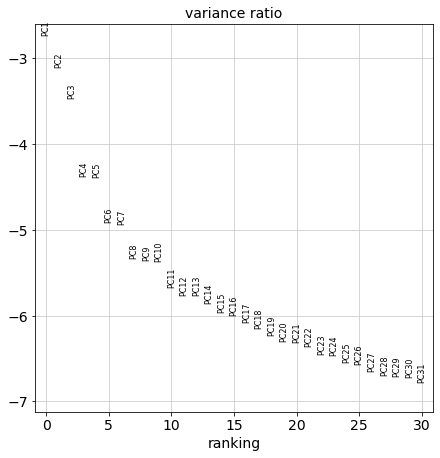

Desired number of PCs to consider for neighbourhood graph:22
computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:29)


In [15]:
adata.raw = adata.copy()
# Normalize and log-transform 
adata = reptract_utils.normalize_log_transform(adata)
# HVGs, PCA, KNN & UMAP
adata = reptract_utils.hvgs_pca_umap(adata)

In [16]:
cell_cycle_genes = [x.strip() for x in open(file='/nfs/users/nfs_v/vl6/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes, random_state = 123)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    501 total control genes are used. (0:00:03)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    415 total control genes are used. (0:00:03)
-->     'phase', cell cycle phase (adata.obs)


In [17]:
adata

AnnData object with n_obs × n_vars = 49049 × 22883
    obs: 'n_counts', 'n_genes', 'sample', 'percent_mito', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'donor', 'stage_pcw', 'sex', 'condition', 'timepoint', 'batch', 'S_score', 'G2M_score', 'phase'
    var: 'GeneID-0', 'GeneName-0', 'n_cells-0', 'GeneID-1', 'GeneName-1', 'n_cells-1', 'GeneID-10', 'GeneName-10', 'n_cells-10', 'GeneID-11', 'GeneName-11', 'n_cells-11', 'GeneID-12', 'GeneName-12', 'n_cells-12', 'GeneID-13', 'GeneName-13', 'n_cells-13', 'GeneID-14', 'GeneName-14', 'n_cells-14', 'GeneID-15', 'GeneName-15', 'n_cells-15', 'GeneID-16', 'GeneName-16', 'n_cells-16', 'GeneID-17', 'GeneName-17', 'n_cells-17', 'GeneID-18', 'GeneName-18', 'n_cells-18', 'GeneID-19', 'GeneName-19', 'n_cells-19', 'GeneID-2', 'GeneName-2', 'n_cells-2', 'GeneID-20', 'GeneName-20', 'n_cells-20', 'GeneID-21', 'GeneName-21', 'n_cells-21', 'GeneID-3', 'GeneName-3', 'n_cells-3', 'GeneID-4', 'GeneName-4', 'n_cells-4', 'GeneID-5', 'GeneName-5', 'n_ce

In [20]:
adata.raw.X[20:30, 20:30].toarray()

array([[1., 1., 0., 6., 0., 0., 3., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 2., 0., 0., 0.],
       [0., 1., 1., 5., 0., 0., 0., 0., 0., 1.],
       [1., 0., 2., 0., 0., 0., 1., 0., 0., 0.],
       [0., 1., 0., 5., 0., 0., 2., 1., 0., 0.],
       [0., 4., 0., 1., 0., 0., 2., 1., 1., 0.],
       [0., 1., 0., 1., 0., 0., 4., 0., 0., 0.],
       [0., 2., 1., 4., 0., 0., 2., 0., 0., 0.],
       [0., 1., 2., 4., 0., 0., 2., 0., 0., 1.],
       [2., 4., 1., 2., 0., 0., 1., 0., 1., 0.]], dtype=float32)

In [ ]:
sc.pl.umap(adata, color = ['sample', 'phase', 'stage_pcw', 'sex', 'donor', 'condition', 'timepoint'], ncols = 2)
sc.pl.umap(adata, color = ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 
                           'doublet_scores', 
                          ], ncols = 3, color_map = 'OrRd')

In [ ]:
sc.tl.leiden(adata, resolution = 3, random_state = 1996)
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

In [23]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, 
                         frameon=True, vector_friendly=True, fontsize=14, figsize=[15,7], color_map=None, 
                         format='pdf', facecolor=None, transparent=False,)


In [ ]:
sc.pl.violin(adata, keys = 'doublet_scores', groupby = 'leiden', rotation = 90)

In [ ]:
sc.pl.violin(adata, keys = 'n_genes', groupby = 'leiden', rotation = 90)

In [26]:
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, 
                         frameon=True, vector_friendly=True, fontsize=14, figsize=[7,7], color_map=None, 
                         format='pdf', facecolor=None, transparent=False,)

In [ ]:
low_genes = ['3', '47', '39', '33', '38', '42', '45']
adata = adata[[i not in low_genes for i in adata.obs['leiden']]]
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

In [28]:
adata = anndata.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs)

In [29]:
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 282 genes that are detected in less than 10 cells


normalizing by total count per cell
    finished (0:00:32): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:16)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


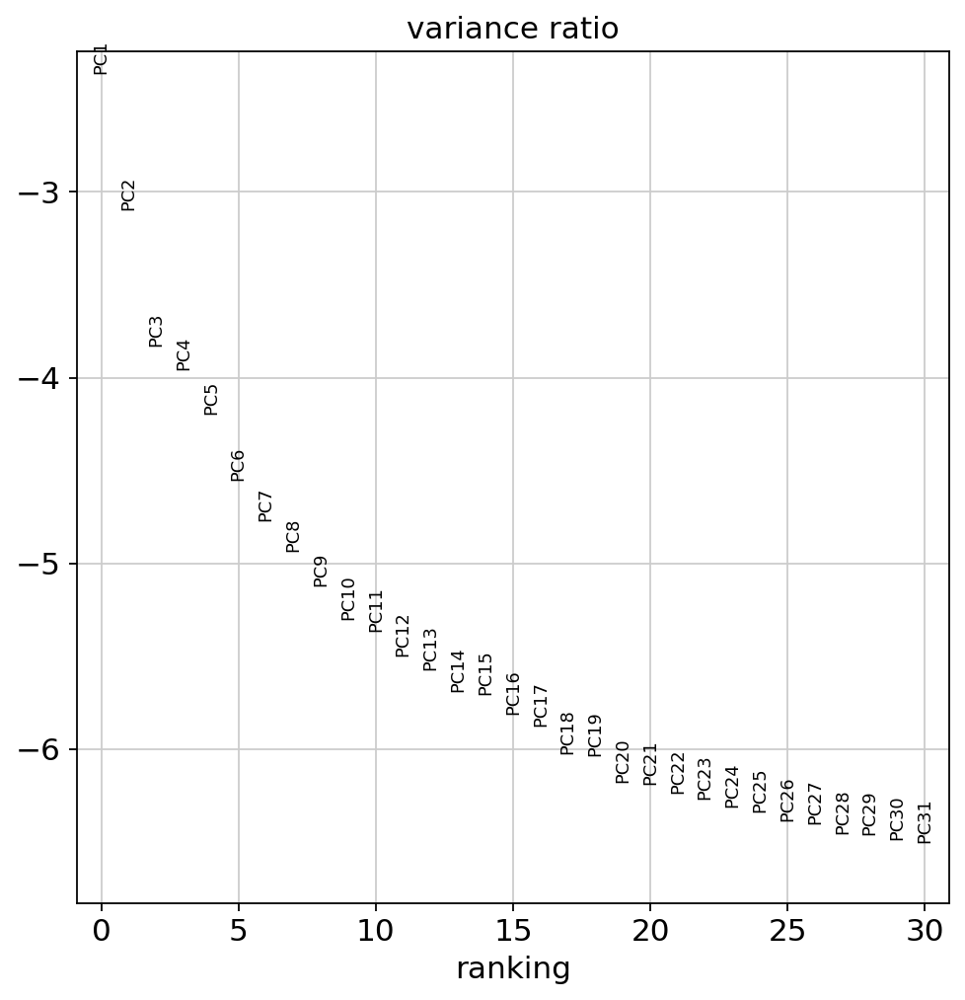

Desired number of PCs to consider for neighbourhood graph:19
computing neighbors
    using 'X_pca' with n_pcs = 19


In [ ]:
adata.raw = adata.copy()
# Normalize and log-transform 
adata = reptract_utils.normalize_log_transform(adata)
# HVGs, PCA, KNN & UMAP
adata = reptract_utils.hvgs_pca_umap(adata)

In [ ]:
sc.pl.umap(adata, color = ['sample', 'phase', 'stage_pcw', 'sex', 'donor', 'condition', 'timepoint'], ncols = 2)
sc.pl.umap(adata, color = ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 
                           'doublet_scores', 
                          ], ncols = 3, color_map = 'OrRd')


In [ ]:
adata.raw.X[20:30,20:30].toarray()

### 4. Harmony integration by donor 

In [35]:
import rpy2.rinterface_lib.callbacks
import logging
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

In [36]:
# Extract PCA matrix and batch array
n_pcs = 19 # Principal components used to perform dimensionality reduction 
pca = adata.obsm['X_pca'][:, 0:(n_pcs)]
batch = adata.obs['donor'] # donor ID, in this case stage

In [37]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)
set.seed(1000)
hem <- HarmonyMatrix(pca, batch, theta=0, lambda = 6, do_pca=FALSE, verbose = FALSE)  
hem = data.frame(hem)

In [38]:
# Add harmony values to the anndata object --> overwriting PCA 
adata.obsm['X_pca_harmony'] = hem.values 

In [39]:
sc.pp.neighbors(adata, n_pcs = n_pcs, use_rep = 'X_pca_harmony', random_state= 123)
sc.tl.umap(adata, min_dist=0.6, spread = 0.8)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignor

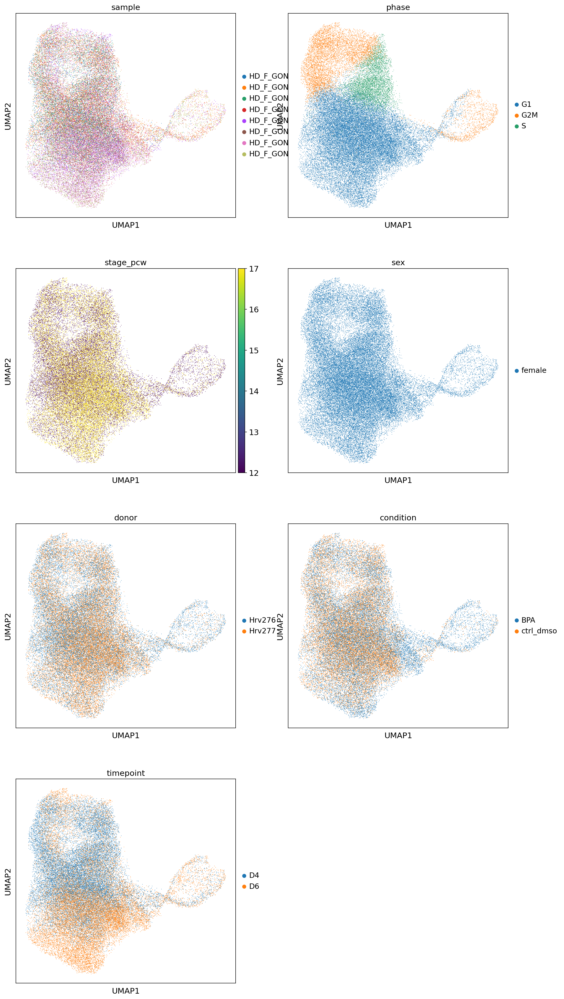

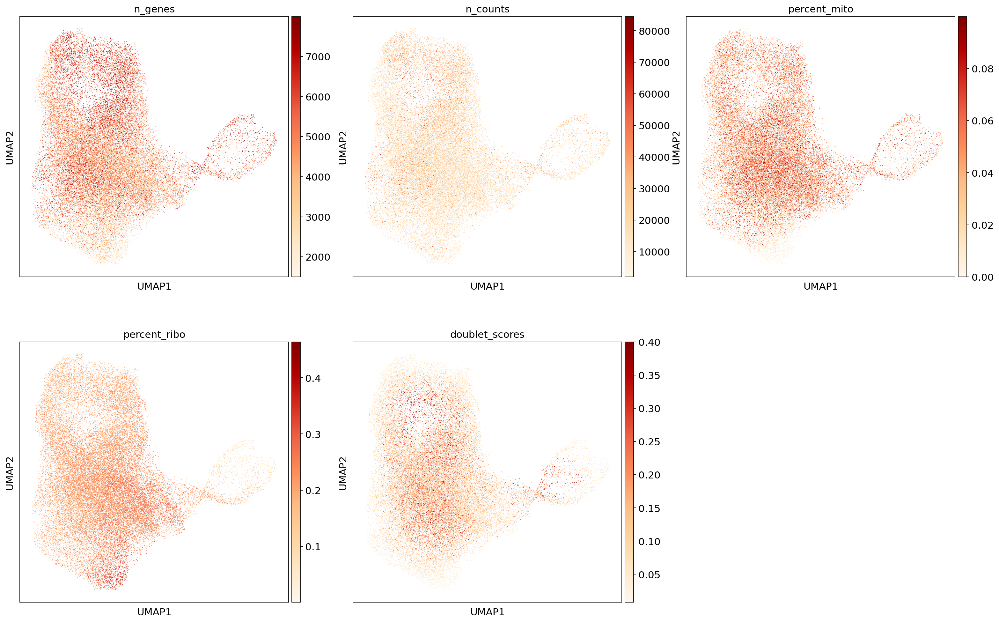

In [40]:
sc.pl.umap(adata, color = ['sample', 'phase', 'stage_pcw', 'sex', 'donor', 'condition', 'timepoint'], ncols = 2)
sc.pl.umap(adata, color = ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 
                           'doublet_scores', 
                          ], ncols = 3, color_map = 'OrRd')


In [ ]:
for i in np.unique(adata.obs['condition']):
    print(i)
    sc.pl.umap(adata, color = ['condition'], groups = i)


In [ ]:
sc.pl.umap(adata, color = ['EPCAM', 'MMP7', 'DLX5', 'WNT7A', 'PAX2', 'PAX8', 
                                      'LGR5', 'UCA1', 'MYH11', 'ESR1', 
                                      'ESR2', 'PPARG', 'PNOC', 'UPK3B', 
                                      'TP63', 'IGFBP3','RUNX3', 
                                    'SLC14A1', 'CYP1B1', 'PGR', 'LTF'
                                     ], 
           use_raw = False, color_map = 'OrRd')

In [ ]:
sc.tl.leiden(adata, resolution = 1, random_state = 1996)
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

In [46]:
import anndata
bdata = anndata.AnnData(X = adata.raw.X, var = adata.raw.var, obs = adata.obs)

In [47]:
from scipy.stats import hypergeom
from scipy.sparse import isspmatrix, csr_matrix

In [48]:
bdata.X[20:30, 20:30].toarray()

array([[ 0.,  2.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.],
       [ 4.,  0.,  1.,  0.,  0.,  2.,  1.,  1.,  0.,  0.],
       [ 1.,  0.,  1.,  0.,  0.,  4.,  0.,  0.,  0.,  1.],
       [ 2.,  1.,  4.,  0.,  0.,  2.,  0.,  0.,  0.,  0.],
       [ 4.,  1.,  2.,  0.,  0.,  1.,  0.,  1.,  0.,  0.],
       [ 3.,  1.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  1.],
       [ 3.,  0.,  4.,  0.,  0.,  2.,  0.,  1.,  0.,  0.],
       [ 0.,  2.,  0.,  0.,  0.,  3.,  0.,  1.,  0.,  1.],
       [ 3.,  0., 10.,  0.,  0.,  2.,  0.,  0.,  0.,  1.],
       [ 0.,  1.,  7.,  0.,  0.,  2.,  0.,  0.,  0.,  0.]], dtype=float32)

In [49]:
def quick_markers(adata, cluster_key, cell_groups=None, n_markers=10, fdr=0.01, express_cut=0.9, r_output=False):
    """
    Identify top N markers for each cluster in an AnnData object using a TF-IDF-based strategy.

    Parameters
    ----------
    adata : AnnData
        Annotated data matrix from Scanpy.
        
    cluster_key : str
        Key in adata.obs for the cluster labels.
        
    cell_groups : list, default=None
        List of cell groups to be compared in the analysis.
        
    n_markers : int, default=10
        Number of marker genes to return per cluster.
        
    fdr : float, default=0.01
        False discovery rate for the hypergeometric test.
        
    express_cut : float, default=0.9
        Value above which a gene is considered expressed.
        
    r_output : bool, default=False
        Whether reporting the same exact column names as the SoupX version.

    Returns
    -------
    markers : DataFrame
        Data frame with top N markers for each cluster and their statistics.
    """
    if cell_groups is not None:
        adata_ = adata[adata.obs[cluster_key].isin(cell_groups)]
    else:
        adata_ = adata

    # Convert to CSR matrix if necessary and binarize the expression data
    toc = csr_matrix(adata_.X) if not isspmatrix(adata_.X) else adata_.X
    toc_bin = (toc > express_cut).astype(int)
    print("binarised matrix")

    # Cluster information
    clusters = pd.Categorical(adata_.obs[cluster_key]).codes
    unique_clusters = np.unique(clusters)
    cl_counts = np.asarray([np.sum(clusters == cl) for cl in unique_clusters]).reshape(-1,1)

    # Calculate observed and total frequency
    n_obs = np.asarray([np.asarray(toc_bin[clusters == cl, :].sum(axis=0)).flatten() for cl in unique_clusters])
    n_tot = n_obs.sum(axis=0)

    # Term Frequency (TF), Inverse Document Frequency (IDF) and TF-IDF
    tf = n_obs / cl_counts
    idf = np.log(len(clusters) / n_tot)
    tf_idf = tf * idf
    print("computed TF-IDF")
    print(tf.shape[1])
    
    # Calculate additional metrics
    gene_freq_outside_cluster = (n_tot - n_obs) / (len(clusters) - cl_counts)
    gene_freq_global = n_tot / len(clusters)
    print(gene_freq_outside_cluster.shape, gene_freq_global.shape)
    
    # Calculate second-best TF score and corresponding cluster name
    second_best_tf = np.zeros_like(tf)
    second_best_cluster_idx = np.zeros(tf.shape[1], dtype=int)
    for gene_idx in range(tf.shape[1]):
        tf_scores = tf[:, gene_idx]
        second_best_idx = np.argsort(tf_scores)[-2]  # Get index of second-highest value
        second_best_tf[:, gene_idx] = tf_scores[second_best_idx]
        second_best_cluster_idx[gene_idx] = unique_clusters[second_best_idx]
    
    # P-values and FDR adjustment
    from scipy.stats import hypergeom
    from tqdm import tqdm

    p_values = []

    M = len(clusters)  # total population
    M = int(M)
    n_tot_int = n_tot.astype(int)
    cl_counts_int = cl_counts.astype(int)
    n_obs_int = n_obs.astype(int)

    num_clusters = len(unique_clusters)
    num_genes = n_obs.shape[1]

    for i in range(num_clusters):
        pvals_for_cluster = []
        # Show a progress bar for the genes in this cluster
        for j in tqdm(range(num_genes), desc=f"Computing p-values for cluster {i+1}/{num_clusters}"):
            k = n_obs_int[i, j] - 1
            if k < 0:
                pval = 1.0
            else:
                pval = hypergeom.sf(k, M, n_tot_int[j], cl_counts_int[i, 0])
            pvals_for_cluster.append(pval)
        p_values.append(pvals_for_cluster)

    p_values = np.array(p_values)
    
    # Instead of a list comprehension, do a loop with tqdm
    q_values_list = []
    num_genes = p_values.shape[1]
    for i in tqdm(range(num_genes), desc="Computing q-values"):
        sorted_p = np.sort(p_values[:, i])
        q_values_for_gene = np.minimum.accumulate(sorted_p)
        q_values_list.append(q_values_for_gene)
    q_values = np.array(q_values_list).T

    # Select top N markers by iterating over columns of p-values matrix
    top_markers = {cl: [] for cl in unique_clusters}
    for gene_idx in tqdm(range(tf_idf.shape[1]), desc="Selecting top markers"):
        for cl in unique_clusters:
            if q_values[cl, gene_idx] < fdr:
                top_markers[cl].append((gene_idx, tf_idf[cl, gene_idx]))

    # Sort and select top genes for each cluster
    for cl in top_markers:
        top_markers[cl].sort(key=lambda x: x[1], reverse=True)  # Sort by TF-IDF
        top_markers[cl] = [gene_idx for gene_idx, _ in top_markers[cl][:n_markers]]
        
    print("so far so good")

    # Constructing the output DataFrame
    # Constructing the output DataFrame
    marker_data = []
    for cl, markers in top_markers.items():
        for gene_idx in markers:
            gene = adata.var_names[gene_idx]
            second_best_cl = second_best_cluster_idx[gene_idx]
            marker_data.append({
                'gene': gene,
                'cluster': adata.obs[cluster_key].cat.categories[cl],
                'tf': tf[cl, gene_idx],
                'idf': idf[gene_idx],
                'tf_idf': tf_idf[cl, gene_idx],
                'gene_frequency_outside_cluster': gene_freq_outside_cluster[cl, gene_idx],
                'gene_frequency_global': gene_freq_global[gene_idx],
                'second_best_tf': second_best_tf[cl, gene_idx],
                'second_best_cluster': adata.obs[cluster_key].cat.categories[second_best_cl],
                'pval': p_values[cl, gene_idx],
                'qval': q_values[cl, gene_idx]
            })
            
    markers = pd.DataFrame(marker_data)
    print("managed to make dataframe")
    
    if r_output:
        cols = ['gene', 'cluster', 'tf', 'gene_frequency_outside_cluster', 'second_best_tf', 'gene_frequency_global', 'second_best_cluster', 'tf_idf', 'idf', 'qval']
        markers = markers[cols]
        markers.columns = ['gene', 'cluster', 'geneFrequency', 'geneFrequencyOutsideCluster',
                           'geneFrequencySecondBest', 'geneFrequencyGlobal', 'secondBestClusterName', 'tfidf', 'idf', 'qval']
    return markers

In [50]:
mrks = quick_markers(bdata, cluster_key='leiden', n_markers=30, r_output=True)

binarised matrix
computed TF-IDF
22608
(8, 22608) (22608,)


Selecting top markers: 100%|██████████| 22608/22608 [00:00<00:00, 190742.60it/s]


so far so good
managed to make dataframe


In [55]:
mrks

,gene,cluster,geneFrequency,geneFrequencyOutsideCluster,geneFrequencySecondBest,geneFrequencyGlobal,secondBestClusterName,tfidf,idf,qval
0,SPDEF,0,0.430126,0.217780,0.267826,0.264067,1,0.572735,1.331551,0.000000e+00
1,LGR5,0,0.495020,0.264404,0.495020,0.314674,0,0.572351,1.156218,0.000000e+00
2,SLC40A1,0,0.575418,0.315149,0.381828,0.371883,3,0.569190,0.989175,0.000000e+00
3,BST2,0,0.387617,0.193108,0.296308,0.235507,6,0.560499,1.446013,4.940656e-324
4,AQP3,0,0.477564,0.284381,0.414069,0.326492,5,0.534562,1.119350,4.482976e-272
...,...,...,...,...,...,...,...,...,...,...
205,RUNX3,6,0.237881,0.069509,0.098381,0.081248,4,0.597141,2.510249,8.670567e-173
206,GALNT4,6,0.263884,0.092534,0.102372,0.104481,0,0.596049,2.258750,3.813081e-152
207,SLC26A2,6,0.265490,0.094387,0.160302,0.106316,4,0.595051,2.241337,4.171773e-150
208,GJB1,6,0.385233,0.202416,0.289147,0.215162,0,0.591858,1.536365,1.509320e-111


In [ ]:
cluster = mrks[mrks['cluster'] == '0']['gene'].to_list()[0:25]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
cluster = mrks[mrks['cluster'] == '1']['gene'].to_list()[0:25]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
cluster = mrks[mrks['cluster'] == '2']['gene'].to_list()[0:15]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

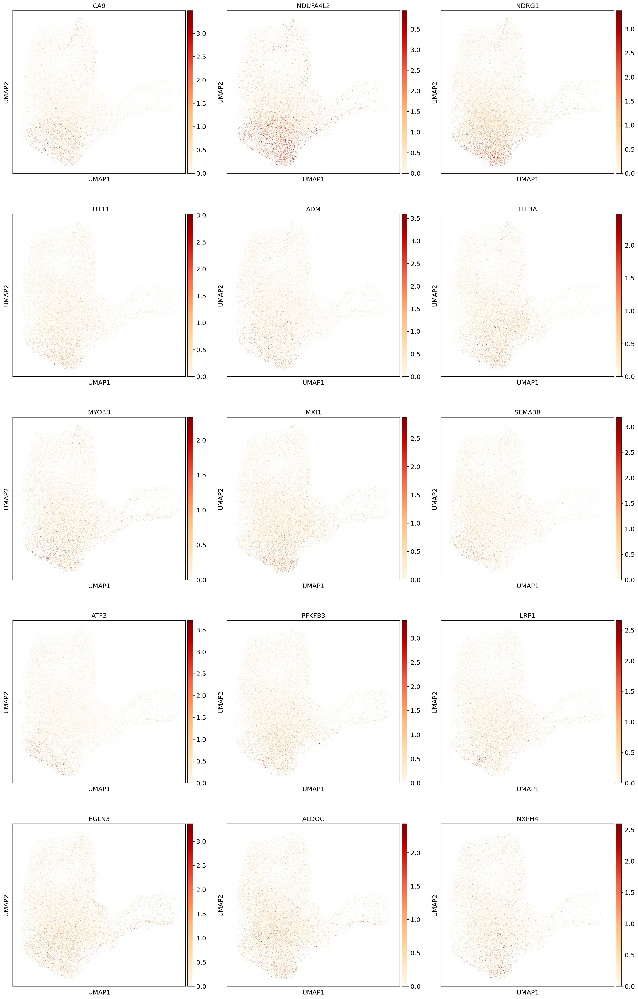

In [59]:
cluster = mrks[mrks['cluster'] == '3']['gene'].to_list()[0:15]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
cluster = mrks[mrks['cluster'] == '4']['gene'].to_list()[0:15]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
cluster = mrks[mrks['cluster'] == '5']['gene'].to_list()[0:15]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
cluster = mrks[mrks['cluster'] == '6']['gene'].to_list()[0:15]
sc.pl.umap(adata, color = cluster, color_map = 'OrRd', ncols = 3, use_raw = False)

In [ ]:
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data')

In [35]:
celltype_dic = {'0' : 'Non-Ciliated Epi', '1' : 'Non-Ciliated Epi', '2' : 'Non-Ciliated Epi', '3' : 'Non-Ciliated Epi',
                '4' : 'Non-Ciliated Epi', '5' : 'Non-Ciliated Epi', '6' : 'Non-Ciliated Epi', 
               '7' : 'Non-Ciliated Epi', '8' : 'Non-Ciliated Epi', '9' : 'Non-Ciliated Epi', 
               '10' : 'Ciliated Epi', '11' : 'Non-Ciliated Epi', '12' : 'Non-Ciliated Epi', 
               '13' : 'Non-Ciliated Epi',}
adata.obs['celltype'] = adata.obs.leiden.map(celltype_dic)

/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


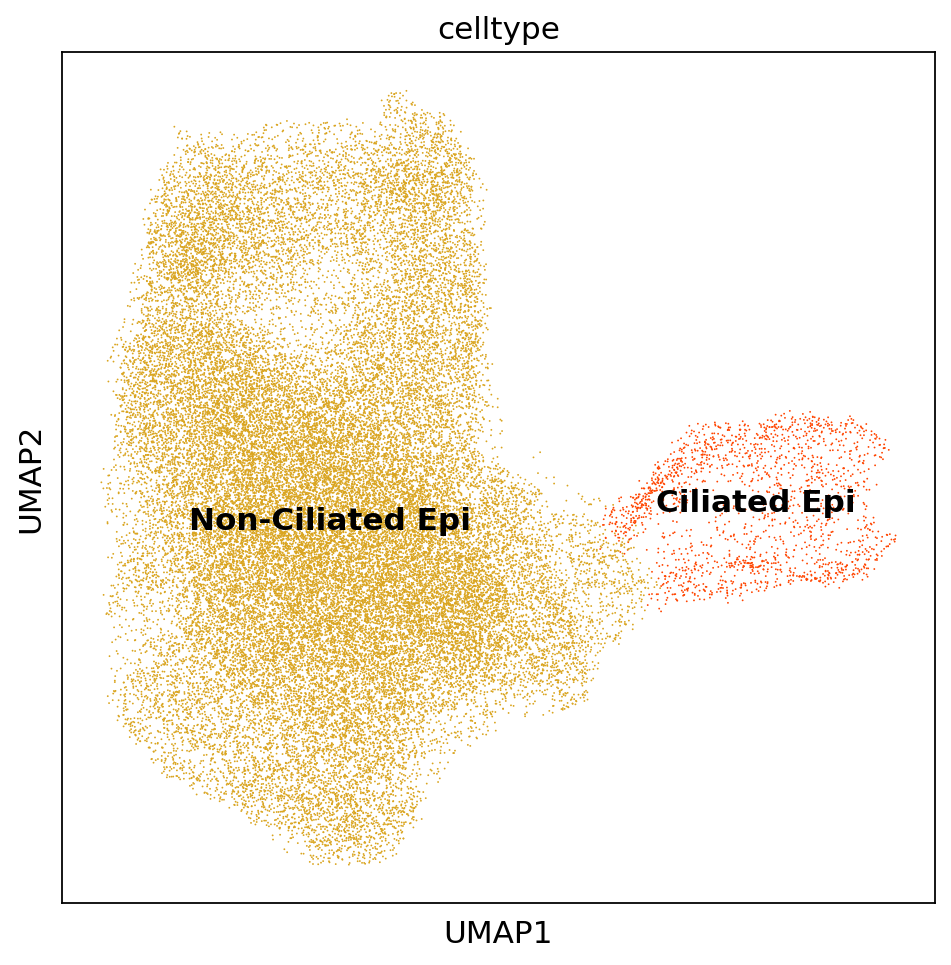

In [36]:
sc.pl.umap(adata, color = 'celltype', legend_loc = 'on data')

In [69]:
# Save 
adata.write('/nfs/team292/vl6/FetalReproductiveTract/organoids_BPA.h5ad')

In [2]:
adata = sc.read('/nfs/team292/vl6/FetalReproductiveTract/organoids_BPA.h5ad')
adata.shape

(44678, 22601)

In [3]:
adata.obs[['celltype', 'condition']].value_counts()

celltype          condition
Non-Ciliated Epi  ctrl_dmso    20829
                  BPA          20480
Ciliated Epi      BPA           2289
                  ctrl_dmso     1080
dtype: int64

In [4]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')
adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories([
    'Non-Ciliated Epi', 'Ciliated Epi'
])

/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


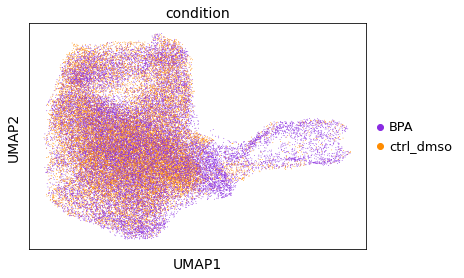

In [5]:
sc.pl.umap(adata, color = 'condition', palette = ['blueviolet', 'darkorange'], 
           save = '_BPA_condition')

/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


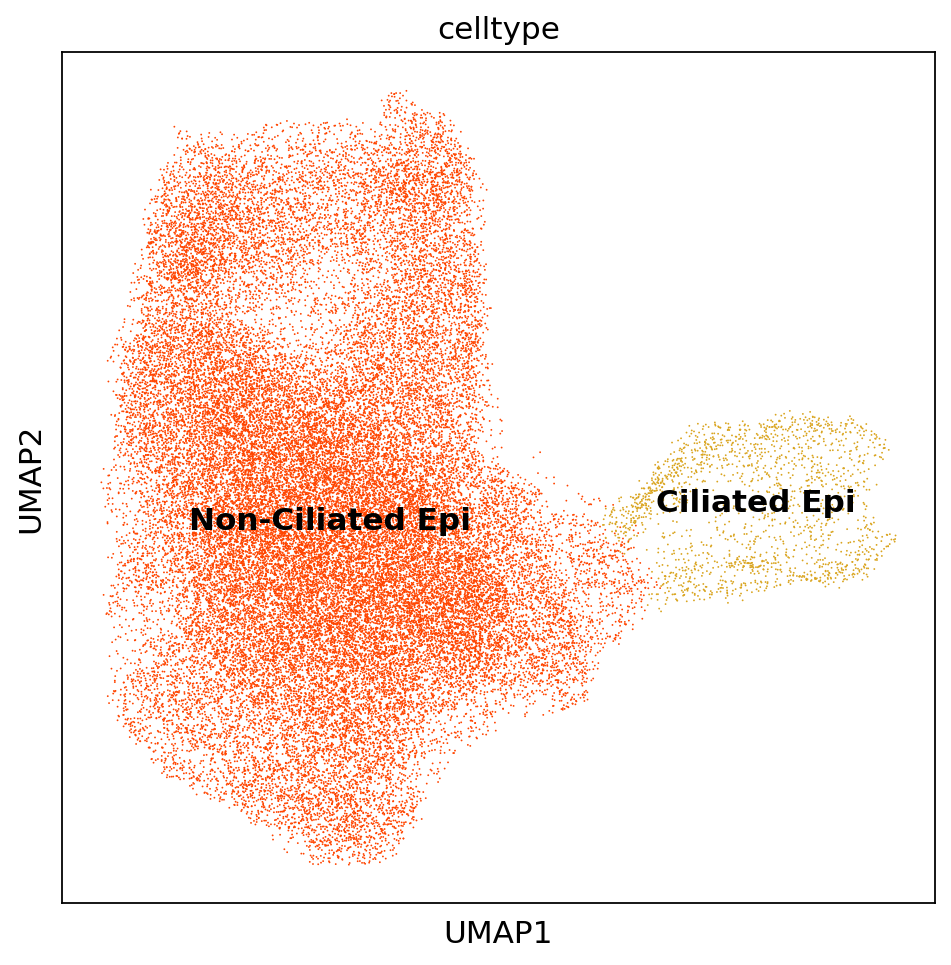

In [40]:
sc.pl.umap(adata, color = 'celltype', legend_loc = 'on data', palette = ['orangered', 'goldenrod'], 
           save = '_BPA_celltype')

In [8]:
adata.obs[['condition']].value_counts()

condition
BPA          22769
ctrl_dmso    21909
dtype: int64

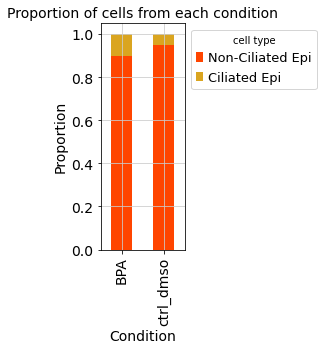

In [10]:
counts = adata.obs[['condition', 'celltype']].value_counts()
counts_df = counts.reset_index(name='count')
counts_df.columns = ['condition', 'celltype', 'count']
total_counts_per_celltype = counts_df.groupby('condition')['count'].transform('sum')

counts_df['proportion'] = counts_df['count'] / total_counts_per_celltype
pivot_df = counts_df.pivot_table(index='condition', columns='celltype', values='proportion', aggfunc='sum', fill_value=0)


import seaborn as sns
import matplotlib.pyplot as plt

# Plot stacked bar plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(1.5, 4), color=['orangered', 'goldenrod'])

# Add labels and title
ax.set_title('Proportion of cells from each condition')
ax.set_xlabel('Condition')
ax.set_ylabel('Proportion')
ax.legend(title='cell type', loc='upper left', bbox_to_anchor=(1, 1))

plt.savefig('BPA_ctrl_barplot.pdf', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

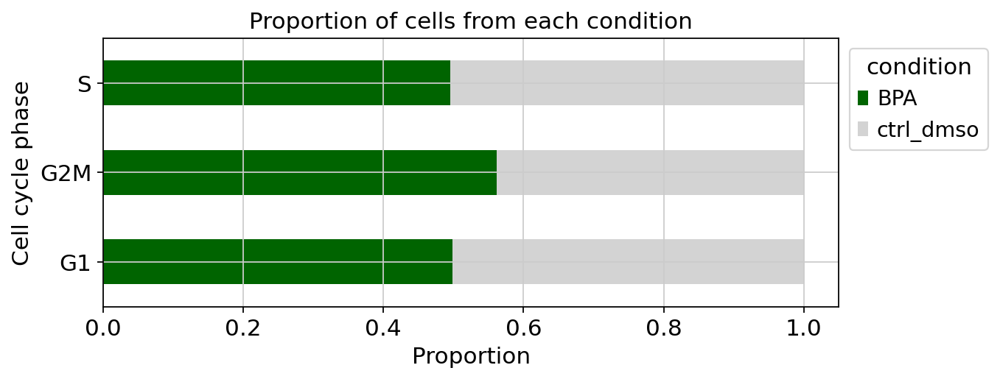

In [68]:
counts = adata.obs[['phase', 'condition']].value_counts()
counts_df = counts.reset_index(name='count')
counts_df.columns = ['phase', 'condition', 'count']
total_counts_per_celltype = counts_df.groupby('phase')['count'].transform('sum')

counts_df['proportion'] = counts_df['count'] / total_counts_per_celltype
pivot_df = counts_df.pivot_table(index='phase', columns='condition', values='proportion', aggfunc='sum', fill_value=0)


import seaborn as sns
import matplotlib.pyplot as plt

# Plot stacked bar plot
ax = pivot_df.plot(kind='barh', stacked=True, figsize=(8, 3), color=['darkgreen', 'lightgray'])

# Add labels and title
ax.set_title('Proportion of cells from each condition')
ax.set_xlabel('Proportion')
ax.set_ylabel('Cell cycle phase')
ax.legend(title='condition', loc='upper left', bbox_to_anchor=(1, 1))

# Display the plot
plt.show()

In [120]:
adata_g1 = adata[[i == 'G1' for i in adata.obs['phase']]]
adata_g1.obs['celltype'].value_counts()

Non-Ciliated Epi    29307
Ciliated Epi         2052
Name: celltype, dtype: int64

In [71]:
adata_g1 = adata_g1[[i == 'Non-Ciliated Epi' for i in adata_g1.obs['celltype']]]
adata_g1.shape

(29307, 22601)

In [72]:
import anndata
adata_g1 = anndata.AnnData(X = adata_g1.raw.X, var = adata_g1.raw.var, obs = adata_g1.obs)
adata_g1.shape

(29307, 22601)

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/envs/atac_env/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


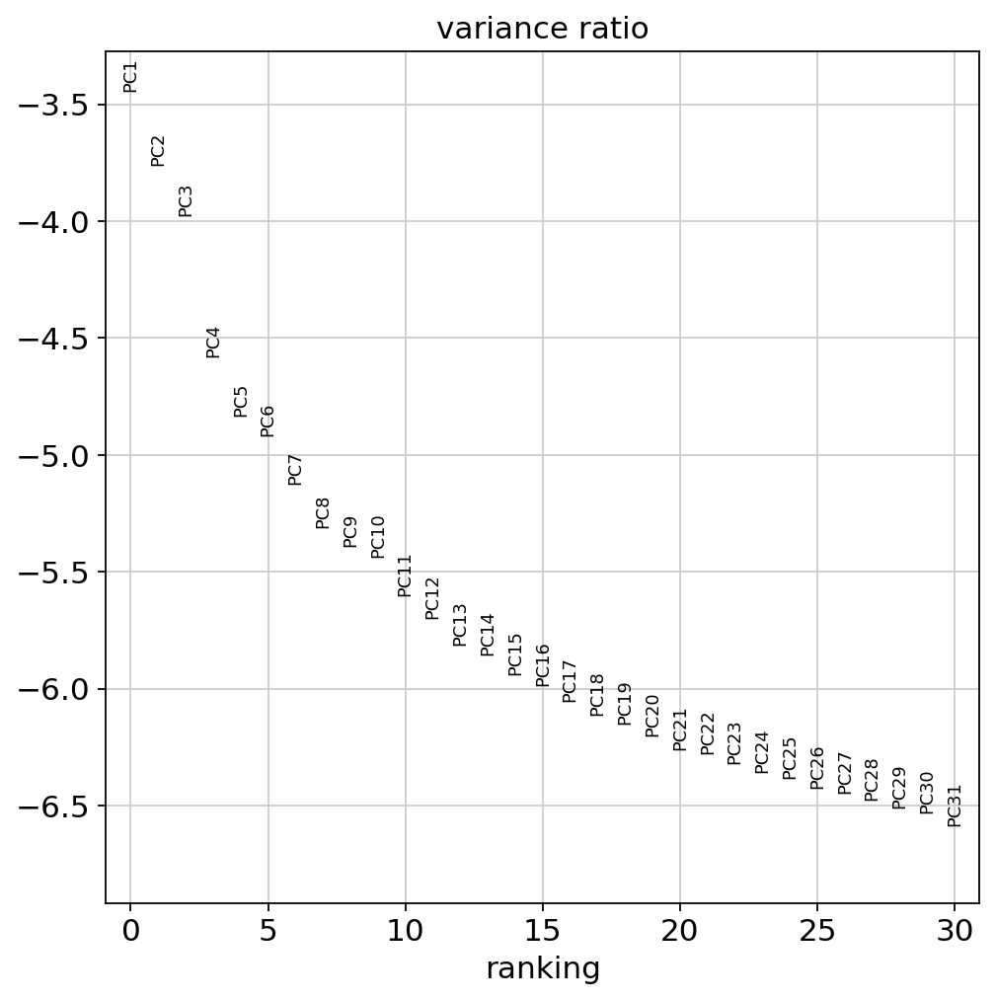

Desired number of PCs to consider for neighbourhood graph:14
computing neighbors
    using 'X_pca' with n_pcs = 14
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [73]:
adata_g1.raw = adata_g1.copy()
# Normalize and log-transform 
adata_g1 = reptract_utils.normalize_log_transform(adata_g1)
# HVGs, PCA, KNN & UMAP
adata_g1 = reptract_utils.hvgs_pca_umap(adata_g1)

In [ ]:
sc.pl.umap(adata_g1, color = ['sample', 'phase', 'stage_pcw', 'sex', 'donor', 'condition', 'timepoint'], ncols = 2)
sc.pl.umap(adata_g1, color = ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 
                           'doublet_scores', 
                          ], ncols = 3, color_map = 'OrRd')

In [75]:
# Extract PCA matrix and batch array
n_pcs = 14 # Principal components used to perform dimensionality reduction 
pca = adata_g1.obsm['X_pca'][:, 0:(n_pcs)]
batch = adata_g1.obs['donor'] # donor ID, in this case stage

In [76]:
%%R -i pca -i batch -o hem

library(harmony)
library(magrittr)
set.seed(1000)
hem <- HarmonyMatrix(pca, batch, theta=0, lambda = 6, do_pca=FALSE, verbose = FALSE)  
hem = data.frame(hem)

In [77]:
# Add harmony values to the anndata object --> overwriting PCA 
adata_g1.obsm['X_pca_harmony'] = hem.values 
sc.pp.neighbors(adata_g1, n_pcs = n_pcs, use_rep = 'X_pca_harmony', random_state= 123)
sc.tl.umap(adata_g1, min_dist=0.6, spread = 0.8)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [ ]:
sc.pl.umap(adata_g1, color = ['sample', 'phase', 'stage_pcw', 'sex', 'donor', 'condition', 'timepoint'], ncols = 2)
sc.pl.umap(adata_g1, color = ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 
                           'doublet_scores', 
                          ], ncols = 3, color_map = 'OrRd')

In [121]:
adata_g1_raw = anndata.AnnData(X = adata_g1.raw.X, var = adata_g1.raw.var, obs = adata_g1.obs)

In [122]:
# remove mito genes
non_mito_genes = [name for name in adata_g1_raw.var_names if not name.startswith('MT-')]
adata_g1_raw = adata_g1_raw[:, non_mito_genes]

# remove ribo genes
non_ribo_genes = [name for name in adata_g1_raw.var_names if not name.startswith('RP')]
adata_g1_raw = adata_g1_raw[:, non_ribo_genes]

# remove heat shock protein genes
non_hps_genes = [name for name in adata_g1_raw.var_names if not name.startswith('HSP')]
adata_g1_raw = adata_g1_raw[:, non_hps_genes]

# remove genes with a dot in their name
genes_with_dot = [name for name in adata_g1_raw.var_names if '.' in name]
adata_g1_raw = adata_g1_raw[:, ~adata_g1_raw.var_names.isin(genes_with_dot)]
adata_g1_raw.shape

(31359, 17390)

In [81]:
adata_g1_milo = adata_g1_raw.copy()

In [82]:
adata_g1_milo.layers["raw_counts"] = adata_g1_milo.X.copy()

In [83]:
# Normalize and log-transform 
reptract_utils.normalize_log_transform(adata_g1_milo)
adata_g1_milo.layers["log_normalised_counts"] = adata_g1_milo.X.copy()

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [84]:
adata_g1_milo.obsm['X_pca'] = adata_g1.obsm['X_pca']
adata_g1_milo.obsm['X_umap'] = adata_g1.obsm['X_umap']
adata_g1_milo.obsm['X_pca_harmony'] = adata_g1.obsm['X_pca_harmony']

In [85]:
%%R -i adata_g1_milo 
adata_g1_milo

/opt/conda/envs/atac_env/lib/python3.8/site-packages/anndata2ri/py2r.py:38: NotConvertedWarning: Conversion 'py2rpy' not defined for objects of type '<class 'NoneType'>'
  warn(str(e), NotConvertedWarning)


class: SingleCellExperiment 
dim: 17390 29307 
metadata(1): log1p
assays(3): X raw_counts log_normalised_counts
rownames(17390): A1BG A1BG-AS1 ... ZZEF1 hsa-mir-423
rowData names(67): GeneID.0 GeneName.0 ... n_cells.9 n_cells
colnames(29307): HD_F_GON15290542_TAGCCGGCAGTCAGCC
  HD_F_GON15290542_TGGGCGTTCCAAACTG ...
  HD_F_GON15290559_TATCTCATCATGTCCC HD_F_GON15290559_GGGAGATTCTACGAGT
colData names(18): n_counts n_genes ... leiden celltype
reducedDimNames(3): PCA UMAP X_pca_harmony
altExpNames(0):


In [86]:
%%R 
saveRDS(adata_g1_milo, "/nfs/team292/vl6/FetalReproductiveTract/organoids_BPA_g1.rds")

In [54]:
degs = pd.read_csv('/nfs/team292/vl6/FetalReproductiveTract/organoids_BPA_g1_DEGs.csv', index_col = 0)
degs.head()

,logFC_0,adj.P.Val_0,logFC_1,adj.P.Val_1,GeneID
SELENOP,-0.613087,9.212609e-08,0.613087,9.212609e-08,SELENOP
ATP6V1C2,-0.209350,1.642002e-07,0.209350,1.642002e-07,ATP6V1C2
NRIP1,-0.570396,4.406228e-07,0.570396,4.406228e-07,NRIP1
LINC00937,-0.106175,6.057514e-07,0.106175,6.057514e-07,LINC00937
CD200,-0.539004,6.057514e-07,0.539004,6.057514e-07,CD200


In [58]:
filter1 = degs[degs['adj.P.Val_1'] <= 0.01]
filter1 = filter1[filter1['logFC_1'] > 0.5]
filter1

,logFC_0,adj.P.Val_0,logFC_1,adj.P.Val_1,GeneID
SELENOP,-0.613087,9.212609e-08,0.613087,9.212609e-08,SELENOP
NRIP1,-0.570396,4.406228e-07,0.570396,4.406228e-07,NRIP1
CD200,-0.539004,6.057514e-07,0.539004,6.057514e-07,CD200
PGR,-0.571104,6.464057e-07,0.571104,6.464057e-07,PGR
SOX17,-1.286695,3.753331e-06,1.286695,3.753331e-06,SOX17
C2orf88,-1.317242,3.945312e-06,1.317242,3.945312e-06,C2orf88
SCGB2A1,-2.004730,3.945312e-06,2.004730,3.945312e-06,SCGB2A1
RBBP7,-0.555608,3.945312e-06,0.555608,3.945312e-06,RBBP7
SLC39A6,-0.902329,3.945312e-06,0.902329,3.945312e-06,SLC39A6
CADM1,-0.790169,6.127561e-06,0.790169,6.127561e-06,CADM1


In [48]:
import decoupler as dc

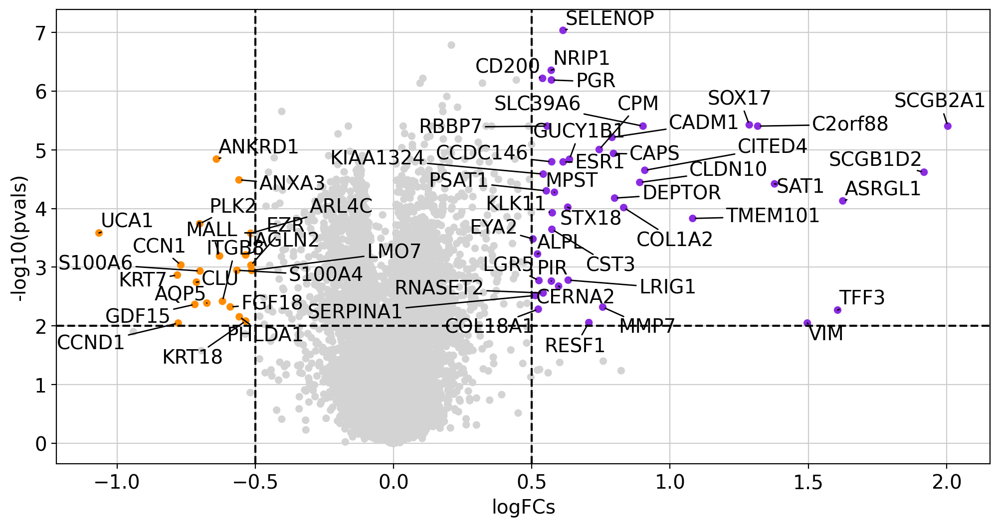

In [53]:
dc.plot_volcano_df(
    degs,
    x='logFC_1',
    y='adj.P.Val_1',
    lFCs_thr = 0.5,
    sign_thr = 0.01,
    top = 70,
#     sign_limit = 40,
    color_pos = 'blueviolet',
    color_neg = 'darkorange',
    color_null='lightgray',
    figsize=(12, 6), 
    save = '_BPA_DMSO_nonciliated_DE.pdf'
)